## **Satellite Image Classification Model**

**Author-1 : Purushothaman Natarajan**

**Author-2 : Kamal Basha**

Source Dataset : Kaggle

Dataset Name : AID: A scene classification dataset

Link : https://www.kaggle.com/datasets/jiayuanchengala/aid-scene-classification-datasets

Approach: Transfer learning for Image classification using pre-trained models on ImageNet Dataset.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Unzip the dataset folder in the path

# Run this block once

import zipfile
import os

# def unzip_folder(zip_path, extract_path):
#     with zipfile.ZipFile(zip_path, 'r') as zip_ref:
#         zip_ref.extractall(extract_path)

# # Example usage:
# zip_path = '/content/drive/MyDrive/RS LLM/Classification Model/AID Dataset.zip'
# extract_path = '/content/drive/MyDrive/RS LLM/Classification Model/Dataset'
# unzip_folder(zip_path, extract_path)


In [ ]:
!pip install opencv-python

In [ ]:
!pip install tensorflow==2.15
!pip install keras==2.15.0
!pip install scikit-learn
!pip install pandas
!pip install numpy
!pip install tabulate
!pip install seaborn

In [ ]:
from PIL import Image
import os

In [ ]:
#print the current directory
print(os.getcwd())

/content


In [ ]:
# Load the images and labels

import os
from PIL import Image

images = []
labels = []

master_data_path = "/content/drive/MyDrive/RS LLM/Classification Model/Dataset/AID"

def load_images_and_labels(folder_path, label):
    for filename in os.listdir(folder_path):
        file_path = os.path.join(folder_path, filename)
        if os.path.isdir(file_path):
            load_images_and_labels(file_path, filename)
        elif filename.lower().endswith(('png', 'jpeg', 'jpg')):
            try:
                img = Image.open(file_path)
                images.append(img)
                labels.append(label)
            except Exception as e:
                print(f'Error loading the image {file_path}: {str(e)}')
        else:
            print(f'Skipping non-image file: {file_path}')

for folder_name in os.listdir(master_data_path):
    folder_path = os.path.join(master_data_path, folder_name)
    if os.path.isdir(folder_path):
        load_images_and_labels(folder_path, folder_name)


print(f'Images loaded: {len(images)}')
print(f'Images loaded: {len(labels)}')

Images loaded: 3339
Images loaded: 3339


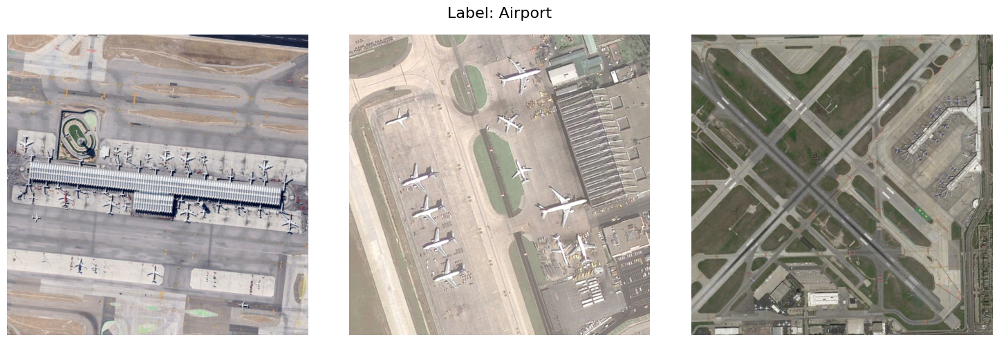

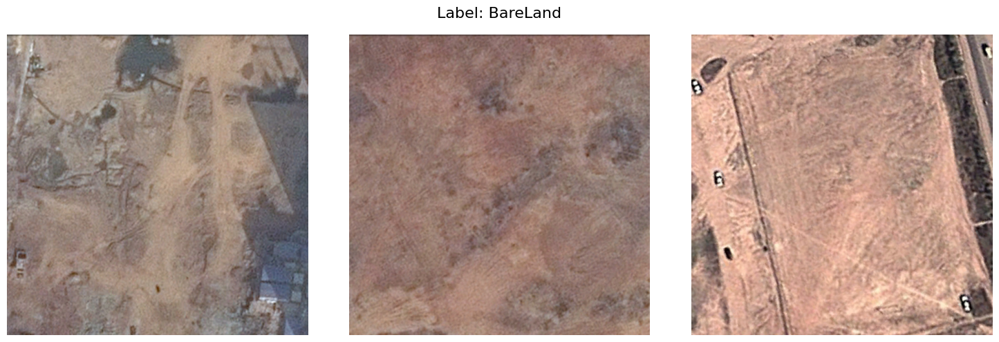

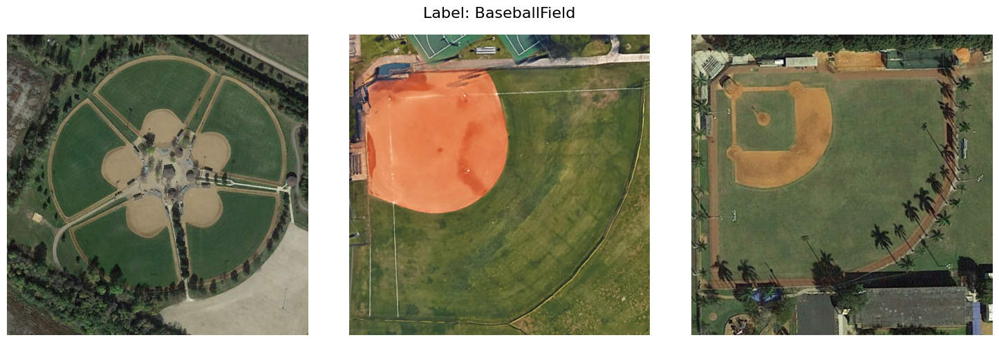

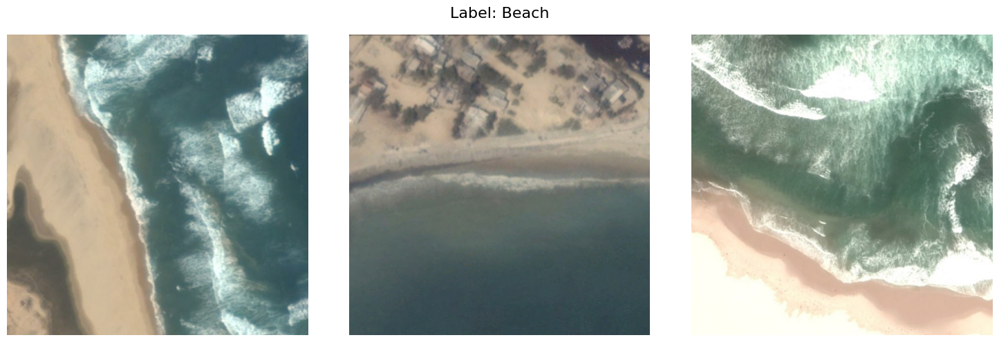

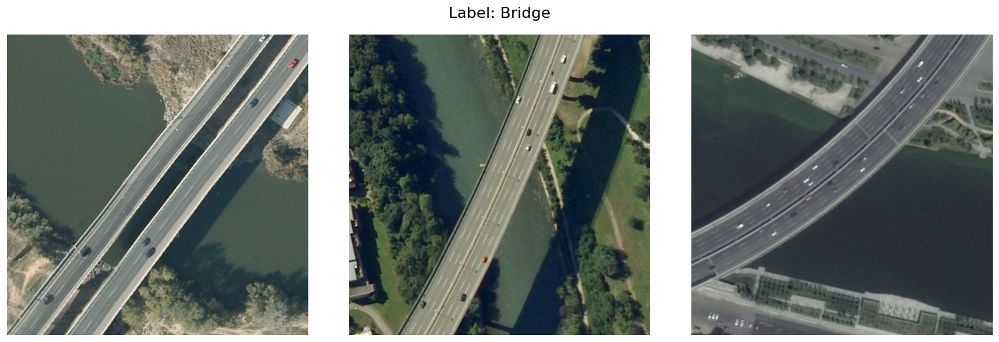

...

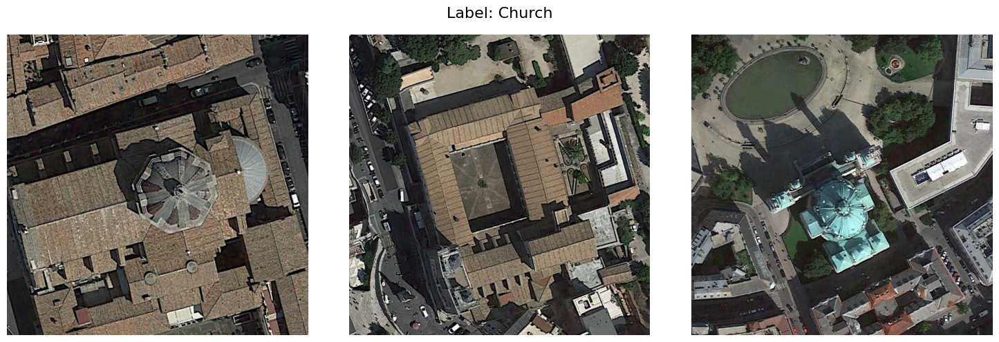

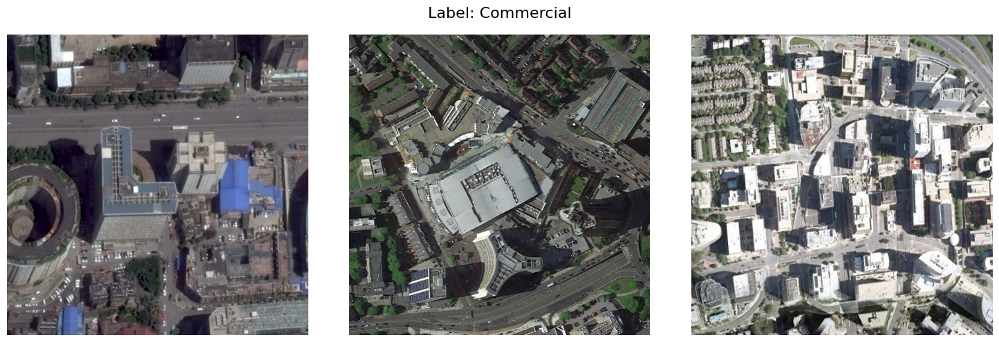

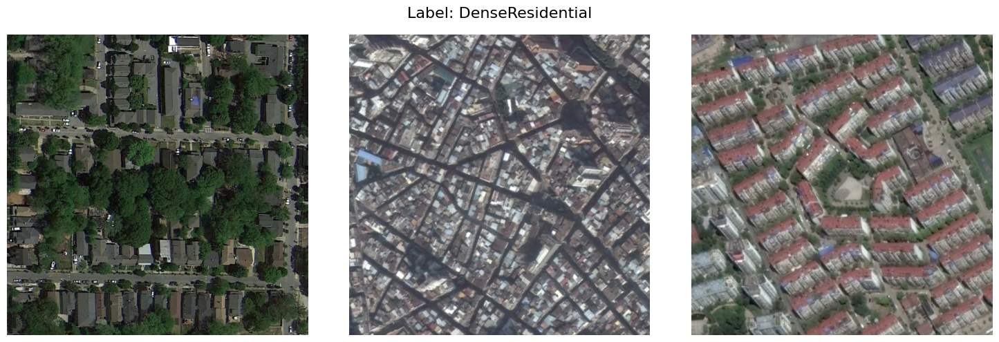

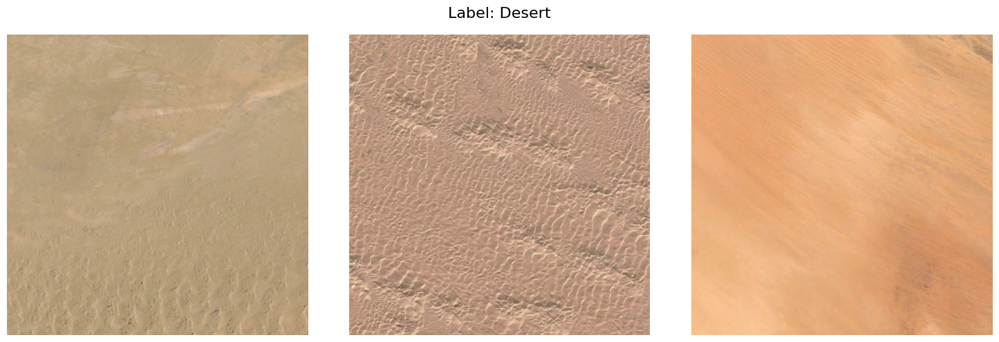

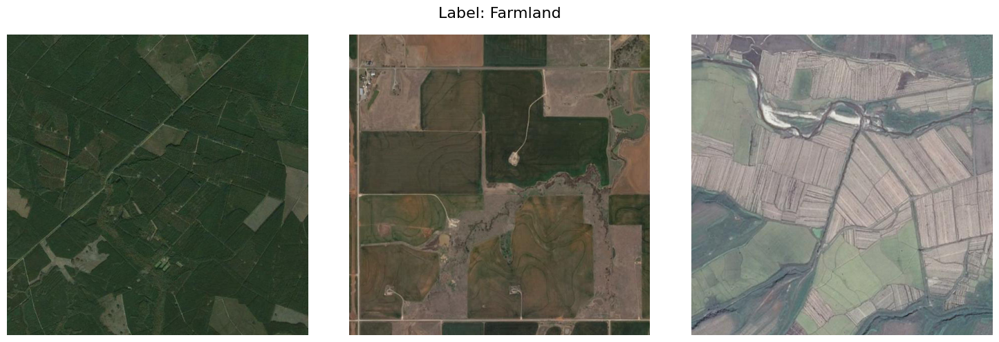

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Convert labels to a 1-dimensional array
labels = np.array(labels)

# Find unique labels
unique_labels = np.unique(labels)

# Define the number of images to display for each unique label
num_images_per_label = 3

# Iterate through unique labels
for label in unique_labels:
    # Find indices of images with the current label
    label_indices = np.where(labels == label)[0]

    # Take the first three indices if available
    label_indices = label_indices[:min(num_images_per_label, len(label_indices))]

    # Create subplots for the current label
    fig, axes = plt.subplots(1, num_images_per_label, figsize=(15, 5))
    fig.suptitle(f'Label: {label}', fontsize=16)

    # Iterate through images corresponding to the current label
    for i, index in enumerate(label_indices):
        # Ensure image is retrieved correctly
        axes[i].imshow(images[index])
        # axes[i].set_title(f'Image {i+1}')
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()


In [ ]:
#counting the number of labels in each classes

count_of_classes = {}

for label in labels:
    if label in count_of_classes:
        count_of_classes[label] +=1
    else:
        count_of_classes[label] = 1


for key, value in count_of_classes.items():
    print(f'{key}:{value}')

Airport:360
BareLand:310
BaseballField:220
Beach:400
Bridge:360
Center:260
Church:240
Commercial:350
DenseResidential:410
Desert:300
Farmland:129


In [ ]:
Dimensions = []

for idx, img in enumerate(images):
    width, height = img.size
    current_dimension = (width, height)
    Dimensions.append(current_dimension)

unique_dimension_count = len(list(set(Dimensions)))

print(f'we have images with {unique_dimension_count} various dimensions')

we have images with 1 various dimensions


In [ ]:
import numpy as np
from PIL import Image

# Define the target dimension
target_dimension = (299, 299)

# List to store resized images
resized_images = []

# Resize and normalize each image
for img in images:
    # Resize the image
    resized_img = img.resize(target_dimension)

    # Convert to numpy array and normalize
    resized_img_np = np.array(resized_img, dtype=np.float32) / 255.0

    # Append to the list of resized images
    resized_images.append(resized_img_np)

# Convert the list of resized images to numpy array
normalized_resized_images = np.array(resized_images)

# Verify the shape and data type of processed_images
print("Shape of normalized_resized_images:", normalized_resized_images.shape)
print("Data type of normalized_resized_images:", normalized_resized_images.dtype)

Shape of normalized_resized_images: (3339, 299, 299, 3)
Data type of normalized_resized_images: float32


Airport


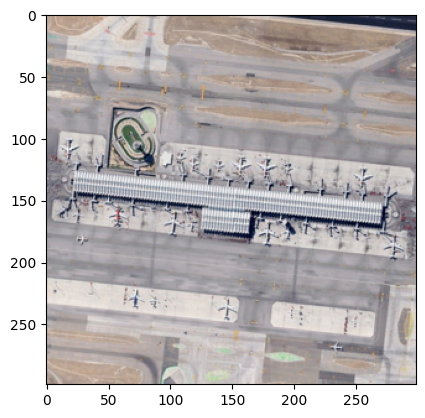

In [ ]:
print(labels[0])
plt.imshow(normalized_resized_images[0])
plt.show()

In [ ]:
unique_labels = set(list(labels))
num_labels = len(unique_labels)
print(num_labels)

11


In [ ]:
import numpy as np
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

# Process images and labels
processed_images = normalized_resized_images
processed_labels = labels

# Encode labels to one-hot
label_encoder = LabelEncoder()
integer_encoded_labels = label_encoder.fit_transform(processed_labels)
onehot_encoder = OneHotEncoder(sparse=False)
onehot_encoded_labels = onehot_encoder.fit_transform(integer_encoded_labels.reshape(-1, 1))

# Print unique labels and their corresponding classes
unique_labels = list(set(processed_labels))
label_classes = label_encoder.transform(unique_labels)
label_class_mapping = dict(zip(unique_labels, label_classes))
print("Label and Class Mapping:")
for label, class_val in label_class_mapping.items():
    print(f"{label}: {class_val}")

# Convert to numpy arrays
processed_images, onehot_encoded_labels = np.array(processed_images), np.array(onehot_encoded_labels)

# Define the path to save the processed data
save_path = "/content/drive/MyDrive/RS LLM/Classification Model/Model and Data Backups/"

# Save processed data
np.save(save_path + "processed_images.npy", processed_images)
np.save(save_path + "onehot_encoded_labels.npy", onehot_encoded_labels)

# Display shapes
print("Shape of processed_images:", processed_images.shape)
print("Shape of onehot_encoded_labels:", onehot_encoded_labels.shape)

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


Label and Class Mapping:
Farmland: 10
Commercial: 7
Bridge: 4
Beach: 3
DenseResidential: 8
BaseballField: 2
BareLand: 1
Church: 6
Desert: 9
Airport: 0
Center: 5
Shape of processed_images: (3339, 299, 299, 3)
Shape of onehot_encoded_labels: (3339, 11)


# Model Development

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers

In [ ]:
from tensorflow.keras.applications import InceptionResNetV2

In [ ]:
#importing the model & dense layer for customizing the neural network
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import regularizers

In [ ]:
#input shape & dimension for the pre-trained models
shape=(299, 299, 3)

In [ ]:
base_model = InceptionResNetV2(weights='imagenet', include_top=False, input_shape=shape)
print('Pre-trained model Loaded')

219055592/219055592 [==============================] - 2s 0us/step
Loaded


In [ ]:
base_model.summary()

Model: "inception_resnet_v2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 299, 299, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 149, 149, 32)         864       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 149, 149, 32)         96        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 149, 149, 32)         0         ['batch_norm

In [ ]:
#Freezing the pre-trained model's last layer for transfer learning
for layer in base_model.layers:
    layer.trainable=False

## Customize the model

In [ ]:
print(num_labels)

11


In [ ]:
from tensorflow.keras.layers import Dense, Flatten, BatchNormalization, Dropout

x = base_model.output
x = Flatten()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.25)(x)
    # Add an additional dense layer with batch normalization and dropout
x = Dense(512, activation='relu')(x)
x = Dropout(0.25)(x)
x = Dense(128, activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.25)(x)

predictions = Dense(num_labels, activation='softmax')(x)

custom_model = Model(inputs=base_model.input, outputs=predictions)

print("Customized the model")

Customized the model


In [ ]:
custom_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 299, 299, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 149, 149, 32)         864       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 149, 149, 32)         96        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 149, 149, 32)         0         ['batch_normalization[0][0

## Compile the model

In [ ]:
custom_model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])
print("Compiled Custom Model")

Compiled Custom Model


## Train the model

In [ ]:
from sklearn.model_selection import train_test_split

# Split the data into training and testing sets with stratified sampling
X_train, X_test, y_train, y_test = train_test_split(
    processed_images,
    onehot_encoded_labels,
    test_size=0.3,
    random_state=42,
    stratify=onehot_encoded_labels  # Add this line for stratified sampling
)

X_test, X_val, y_test, y_val = train_test_split(
    X_test,
    y_test,
    test_size=0.5,
    random_state=42,
    stratify=y_test  # Add this line for stratified sampling
)



# Verify the shapes of the training and testing sets
print("Shape of X_train:", X_train.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of X_test:", X_test.shape)
print("Shape of y_test:", y_test.shape)
print("Shape of X_val:", X_val.shape)
print("Shape of y_val:", y_val.shape)

Shape of X_train: (2337, 299, 299, 3)
Shape of y_train: (2337, 11)
Shape of X_test: (501, 299, 299, 3)
Shape of y_test: (501, 11)
Shape of X_val: (501, 299, 299, 3)
Shape of y_val: (501, 11)


In [ ]:
# Map one-hot encoded labels back to original class labels
mapped_labels_train = label_encoder.inverse_transform(np.argmax(y_train, axis=1))
mapped_labels_test = label_encoder.inverse_transform(np.argmax(y_test, axis=1))
mapped_labels_val = label_encoder.inverse_transform(np.argmax(y_val, axis=1))

# Print the label counts for each set
label_counts_train = dict(zip(*np.unique(mapped_labels_train, return_counts=True)))
label_counts_test = dict(zip(*np.unique(mapped_labels_test, return_counts=True)))
label_counts_val = dict(zip(*np.unique(mapped_labels_val, return_counts=True)))

print("Label counts in training set:", label_counts_train)
print("Label counts in testing set:", label_counts_test)
print("Label counts in validation set:", label_counts_val)

Label counts in training set: {'Airport': 252, 'BareLand': 217, 'BaseballField': 154, 'Beach': 280, 'Bridge': 252, 'Center': 182, 'Church': 168, 'Commercial': 245, 'DenseResidential': 287, 'Desert': 210, 'Farmland': 90}
Label counts in testing set: {'Airport': 54, 'BareLand': 47, 'BaseballField': 33, 'Beach': 60, 'Bridge': 54, 'Center': 39, 'Church': 36, 'Commercial': 52, 'DenseResidential': 62, 'Desert': 45, 'Farmland': 19}
Label counts in validation set: {'Airport': 54, 'BareLand': 46, 'BaseballField': 33, 'Beach': 60, 'Bridge': 54, 'Center': 39, 'Church': 36, 'Commercial': 53, 'DenseResidential': 61, 'Desert': 45, 'Farmland': 20}


In [47]:
import os
import numpy as np
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, CSVLogger

def train_and_evaluate_model(X_train, y_train, X_test, y_test, model, model_name, epochs=100):
    """Trains and evaluates the model, saving the best performing model and plotting the confusion matrix.

    Args:
        X_train: Training data features.
        y_train: Training data labels.
        X_test: Testing data features.
        y_test: Testing data labels.
        model: The Keras model to be trained.
        model_name: Name to identify the model.
        epochs: Number of training epochs (default: 100).

    Returns:
        A dictionary containing model name, epoch of best accuracy, and achieved accuracy.
    """

    # Initialize variables for tracking maximum accuracy
    max_accuracy = 0
    max_accuracy_epoch = 0

    # Define callbacks
    model_dir = "/content/drive/MyDrive/RS LLM/Classification Model/Model and Data Backups/Model"
    log_dir = "/content/drive/MyDrive/RS LLM/Classification Model/Model and Data Backups/Logs"
    os.makedirs(model_dir, exist_ok=True)
    os.makedirs(log_dir, exist_ok=True)

    model_path = os.path.join(model_dir, f'{model_name}_model.h5')  # Change file extension to .keras
    log_path = os.path.join(log_dir, f'{model_name}_training_log.csv')

    checkpoint = ModelCheckpoint(model_path, monitor='val_accuracy',
                                 save_best_only=True, save_weights_only=False, mode='max', verbose=1)
    early_stopping = EarlyStopping(monitor='val_accuracy', patience=7, verbose=1)
    csv_logger = CSVLogger(log_path, append=True)

    # Train the model
    history = model.fit(X_train, y_train, epochs=epochs, validation_data=(X_test, y_test), batch_size=16,
                        callbacks=[checkpoint, early_stopping, csv_logger])

    current_epoch_predictions = []
    current_epoch_labels = []

    # Find the epoch with maximum validation accuracy
    max_accuracy_epoch = np.argmax(history.history['val_accuracy'])
    max_accuracy = history.history['val_accuracy'][max_accuracy_epoch]

    # Evaluate the model on the test data
    test_loss, test_accuracy = model.evaluate(X_test, y_test)
    print(f'Test Accuracy for {model_name}: {test_accuracy}')

    # Print information about the best model
    print("-" * 40)
    print(f"Maximum accuracy of {max_accuracy:.2f} achieved at epoch {max_accuracy_epoch+1}")
    print(f"Model with high accuracy is saved at: {model_path}")
    print(f"Training log is saved at: {log_path}")
    print("-" * 40)
    print("\n")

    # Assuming model.predict returns probabilities for each class
    y_pred_probs = model.predict(X_test)

    # Convert probabilities to class labels
    y_pred = np.argmax(y_pred_probs, axis=1)

    # Convert true labels to class labels if y_test is one-hot encoded
    y_true = np.argmax(y_test, axis=1)

    # Generate confusion matrix
    conf_matrix = confusion_matrix(y_true, y_pred)

    # Plot confusion matrix (assuming class_labels is defined elsewhere)
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt='g', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(model_name)
    plt.show()

    return {'Model': model_name, 'Epoch': max_accuracy_epoch+1, 'Accuracy': max_accuracy}


In [48]:
model_name = "InceptionResNetV2"
class_labels = ['Airport', 'BareLand', 'BaseballField', 'Beach', 'Bridge', 'Center', 'Church', 'Commercial', 'DenseResidential', 'Desert', 'Farmland']

In [ ]:
result = train_and_evaluate_model(X_train, y_train, X_test, y_test, custom_model, model_name, epochs=100)

Epoch 1/100
147/147 [==============================] - ETA: 0s - loss: 0.0142 - accuracy: 0.9987
Epoch 1: val_accuracy improved from -inf to 0.93812, saving model to /content/drive/MyDrive/RS LLM/Classification Model/Model and Data Backups/Model/InceptionResNetV2_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


147/147 [==============================] - 159s 1s/step - loss: 0.0142 - accuracy: 0.9987 - val_loss: 0.2095 - val_accuracy: 0.9381
Epoch 2/100
147/147 [==============================] - ETA: 0s - loss: 0.0128 - accuracy: 0.9983
Epoch 2: val_accuracy improved from 0.93812 to 0.94810, saving model to /content/drive/MyDrive/RS LLM/Classification Model/Model and Data Backups/Model/InceptionResNetV2_model.h5
147/147 [==============================] - 159s 1s/step - loss: 0.0128 - accuracy: 0.9983 - val_loss: 0.1874 - val_accuracy: 0.9481
Epoch 3/100
147/147 [==============================] - ETA: 0s - loss: 0.0098 - accuracy: 0.9991
Epoch 3: val_accuracy improved from 0.94810 to 0.95409, saving model to /content/drive/MyDrive/RS LLM/Classification Model/Model and Data Backups/Model/InceptionResNetV2_model.h5
147/147 [==============================] - 157s 1s/step - loss: 0.0098 - accuracy: 0.9991 - val_loss: 0.1720 - val_accuracy: 0.9541
Epoch 4/100
147/147 [==============================]

In [51]:
result

{'Model': 'InceptionResNetV2', 'Epoch': 3, 'Accuracy': 0.9540917873382568}

#### Test the model with the validation set but here its test set

In [55]:
import os
import tensorflow as tf

directory_path = "/content/drive/MyDrive/RS LLM/Classification Model/Model and Data Backups/Model"
loaded_models = {}

for filename in os.listdir(directory_path):

    if filename.endswith(".h5"):
        model_name = os.path.splitext(filename)[0]
        model_path = os.path.join(directory_path, filename)

        # Print the model path for verification
        print("Attempting to load model:", model_path)

        # Load the model without custom objects
        loaded_model = tf.keras.models.load_model(model_path, custom_objects={})
        loaded_models[model_name] = loaded_model

# Print the loaded model names
print("Loaded model names:")
print(list(loaded_models.keys()))

Attempting to load model: /content/drive/MyDrive/RS LLM/Classification Model/Model and Data Backups/Model/InceptionResNetV2_model.h5
Attempting to load model: /content/drive/MyDrive/RS LLM/Classification Model/Model and Data Backups/Model/try_1_InceptionResNetV2_model.h5
Loaded model names:
['InceptionResNetV2_model', 'try_1_InceptionResNetV2_model']


In [56]:
class_labels = ['Airport', 'BareLand', 'BaseballField', 'Beach', 'Bridge', 'Center', 'Church', 'Commercial', 'DenseResidential', 'Desert', 'Farmland']

# Test Set

16/16 [==============================] - 20s 1s/step
Accuracy for InceptionResNetV2_model: 0.95
Classification Report for InceptionResNetV2_model:
                  precision    recall  f1-score   support

         Airport       0.93      0.98      0.95        54
        BareLand       0.94      0.94      0.94        47
   BaseballField       0.97      1.00      0.99        33
           Beach       1.00      1.00      1.00        60
          Bridge       0.98      0.98      0.98        54
          Center       0.93      0.97      0.95        39
          Church       0.97      0.86      0.91        36
      Commercial       0.90      0.90      0.90        52
DenseResidential       0.95      0.94      0.94        62
          Desert       0.96      0.96      0.96        45
        Farmland       1.00      0.95      0.97        19

        accuracy                           0.95       501
       macro avg       0.96      0.95      0.95       501
    weighted avg       0.95      0.95  

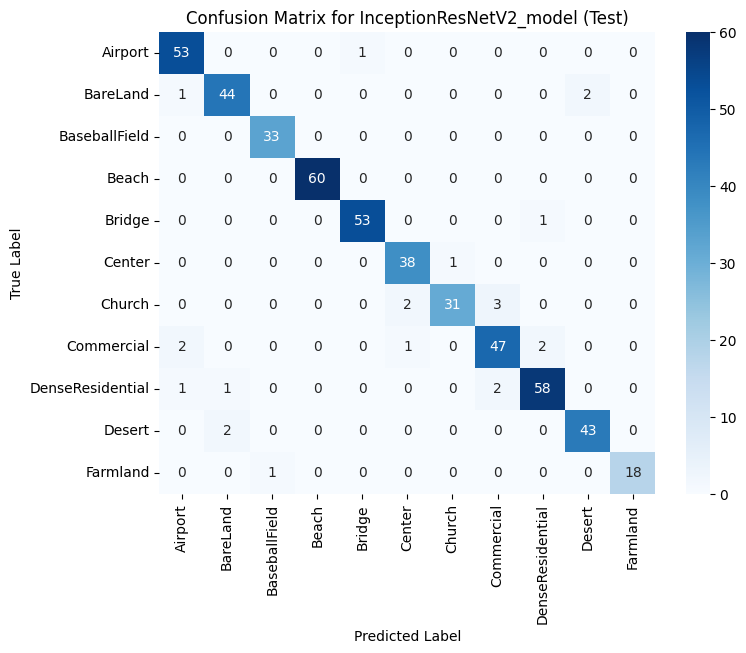

16/16 [==============================] - 19s 1s/step
Accuracy for try_1_InceptionResNetV2_model: 0.96
Classification Report for try_1_InceptionResNetV2_model:
                  precision    recall  f1-score   support

         Airport       0.95      1.00      0.97        54
        BareLand       0.96      0.91      0.93        47
   BaseballField       1.00      1.00      1.00        33
           Beach       0.98      1.00      0.99        60
          Bridge       1.00      1.00      1.00        54
          Center       0.93      0.97      0.95        39
          Church       0.91      0.89      0.90        36
      Commercial       0.92      0.94      0.93        52
DenseResidential       0.98      0.90      0.94        62
          Desert       0.93      0.96      0.95        45
        Farmland       1.00      1.00      1.00        19

        accuracy                           0.96       501
       macro avg       0.96      0.96      0.96       501
    weighted avg       0.96

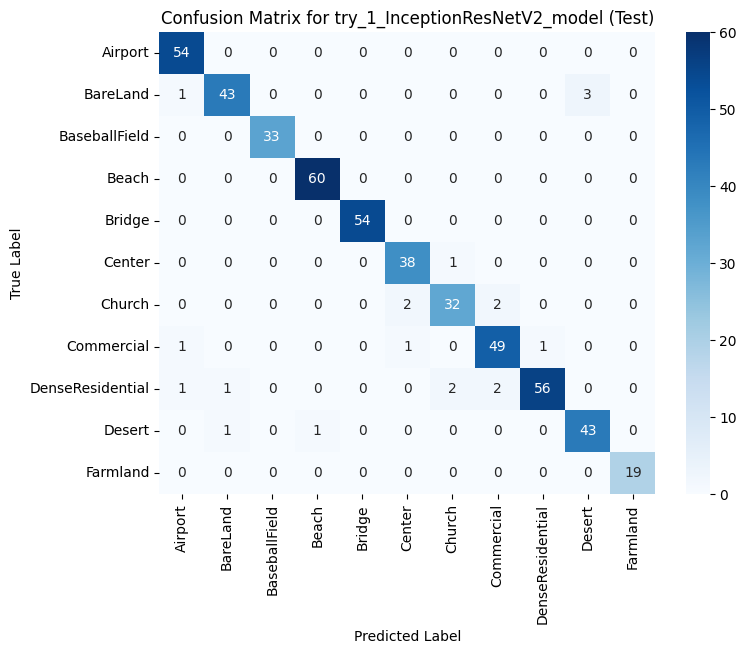

In [57]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os

# Initialize an empty list to store results
test_results = []

# Initialize an empty list to store confusion matrices
conf_matrices = []

for model_name, model in loaded_models.items():
    y_pred_probs = model.predict(X_test)
    y_pred = np.argmax(y_pred_probs, axis=1)
    y_true = np.argmax(y_test, axis=1)

    # Calculate accuracy score
    accuracy = accuracy_score(y_true, y_pred)

    # Generate classification report
    class_report = classification_report(y_true, y_pred, target_names=class_labels)

    # Print individual class prediction accuracy score
    print(f"Accuracy for {model_name}: {accuracy:.2f}")
    print(f"Classification Report for {model_name}:\n{class_report}")

    # Append results to the list
    test_results.append([model_name, accuracy])

    # Calculate confusion matrix
    conf_matrix = confusion_matrix(y_true, y_pred)

    # Append confusion matrix to the list
    conf_matrices.append(conf_matrix)

    # Display confusion matrix using seaborn
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=class_labels, yticklabels=class_labels)
    plt.title(f"Confusion Matrix for {model_name} (Test)")
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")

    # Show the plot
    plt.show()

# Convert the results list to a DataFrame for tabulation
test_results_df = pd.DataFrame(test_results, columns=["Model", "Test Accuracy"])

# Validation set

16/16 [==============================] - 17s 1s/step
Accuracy for InceptionResNetV2_model: 0.94
Classification Report for InceptionResNetV2_model:
                  precision    recall  f1-score   support

         Airport       0.96      0.96      0.96        54
        BareLand       0.88      0.93      0.91        46
   BaseballField       0.97      0.97      0.97        33
           Beach       0.94      1.00      0.97        60
          Bridge       0.98      1.00      0.99        54
          Center       0.92      0.87      0.89        39
          Church       0.88      0.83      0.86        36
      Commercial       0.96      0.94      0.95        53
DenseResidential       0.92      0.98      0.95        61
          Desert       1.00      0.87      0.93        45
        Farmland       0.95      0.90      0.92        20

        accuracy                           0.94       501
       macro avg       0.94      0.93      0.94       501
    weighted avg       0.94      0.94  

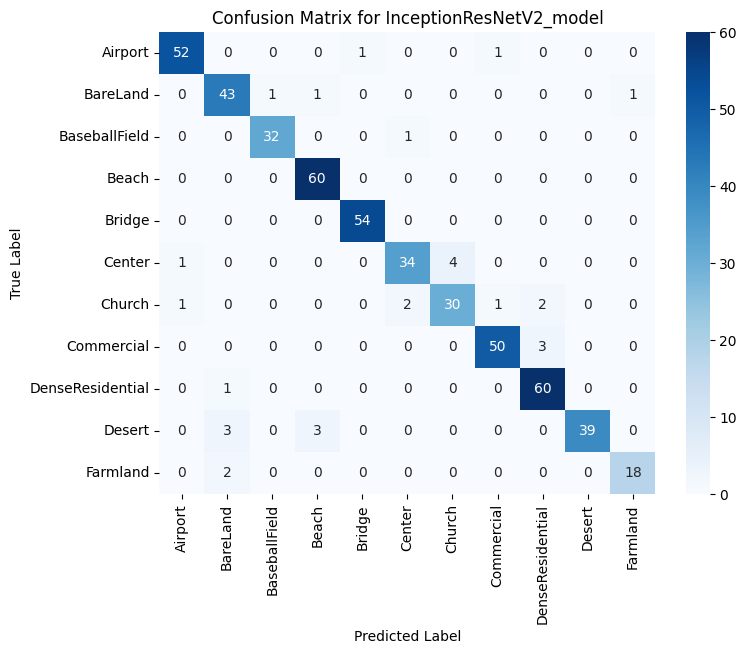

16/16 [==============================] - 16s 1s/step
Accuracy for try_1_InceptionResNetV2_model: 0.95
Classification Report for try_1_InceptionResNetV2_model:
                  precision    recall  f1-score   support

         Airport       0.95      0.96      0.95        54
        BareLand       0.90      0.93      0.91        46
   BaseballField       0.94      0.97      0.96        33
           Beach       0.97      1.00      0.98        60
          Bridge       0.98      1.00      0.99        54
          Center       0.90      0.90      0.90        39
          Church       0.97      0.86      0.91        36
      Commercial       0.96      0.96      0.96        53
DenseResidential       0.97      0.98      0.98        61
          Desert       1.00      0.91      0.95        45
        Farmland       0.95      0.95      0.95        20

        accuracy                           0.95       501
       macro avg       0.95      0.95      0.95       501
    weighted avg       0.95

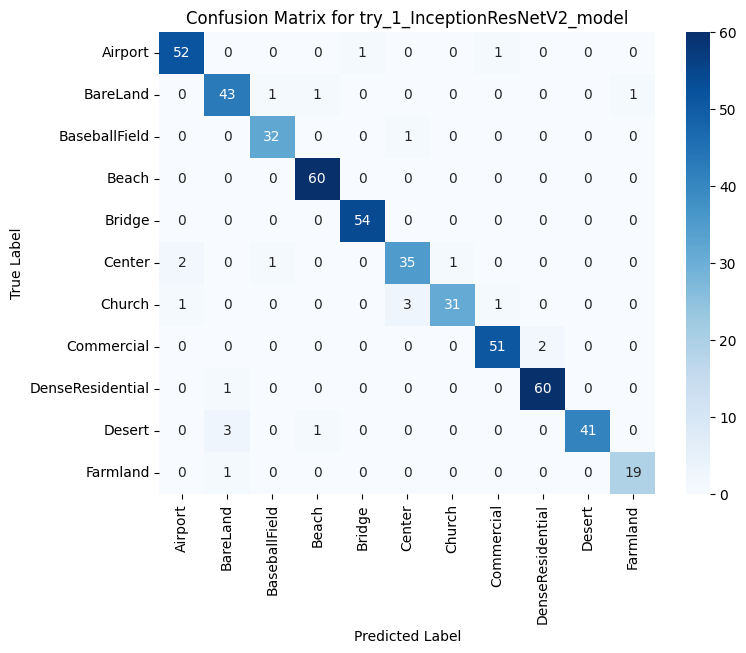

In [58]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os

# Initialize an empty list to store results
val_results = []

# Initialize an empty list to store confusion matrices
conf_matrices = []

for model_name, model in loaded_models.items():
    y_pred_probs = model.predict(X_val)
    y_pred = np.argmax(y_pred_probs, axis=1)
    y_true = np.argmax(y_val, axis=1)

    # Calculate accuracy score
    accuracy = accuracy_score(y_true, y_pred)

    # Generate classification report
    class_report = classification_report(y_true, y_pred, target_names=class_labels)

    # Print individual class prediction accuracy score
    print(f"Accuracy for {model_name}: {accuracy:.2f}")
    print(f"Classification Report for {model_name}:\n{class_report}")

    # Append results to the list
    val_results.append([model_name, accuracy])

    # Calculate confusion matrix
    conf_matrix = confusion_matrix(y_true, y_pred)

    # Append confusion matrix to the list
    conf_matrices.append(conf_matrix)

    # Display confusion matrix using seaborn
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=class_labels, yticklabels=class_labels)
    plt.title(f"Confusion Matrix for {model_name}")
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")

    # Show the plot
    plt.show()

# Convert the results list to a DataFrame for tabulation
val_results_df = pd.DataFrame(val_results, columns=["Model", "Validation Accuracy"])

# The End